In [4]:
import numpy as np
import matplotlib.image as mpimg  
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2  
import copy
import os
from glob import glob
import pandas as pd


%matplotlib inline

In [5]:
IMG_ROOT = '../Dataset/kitti/training/image_2/'
left_image_paths = sorted(glob(os.path.join(IMG_ROOT, '*.png')))





print(f"Number of  images: {len(os.listdir(IMG_ROOT) )}")


Number of  images: 7481


# Filters
In addition to taking advantage of color information, we also have knowledge about patterns of grayscale intensity in an image. Intensity is a measure of light and dark similar to brightness, and we can use this knowledge to detect other areas or objects of interest.
For example, you can often identify the edges of an object by looking at an abrupt change in intensity which happens when an image changes from a very dark to light area.

## 1. Fourier Transforms

The frequency components of an image can be displayed after doing a Fourier Transform (FT). An FT looks at the components of an image (edges that are high-frequency, and areas of smooth color as low-frequency), and plots the frequencies that occur as points in spectrum.

In fact, an FT treats patterns of intensity in an image as sine waves with a particular frequency, and you can look at an interesting visualization of these sine wave components [on this page](https://plus.maths.org/content/fourier-transforms-images).
## High and low frequency
Similarly, frequency in images is a rate of change. But, what does it means for an image to change? Well, images change in space, and a high frequency image is one where the intensity changes a lot. And the level of brightness changes quickly from one pixel to the next. A low frequency image may be one that is relatively uniform in brightness or changes very slowly. 
Most images have both high-frequency and low-frequency components

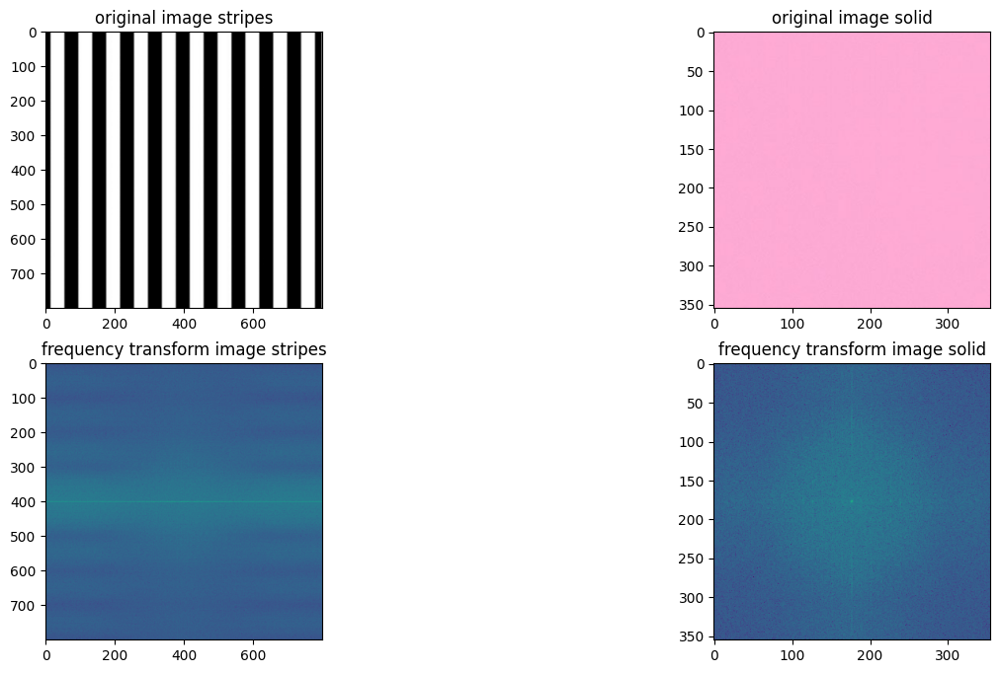

In [6]:
image_stripes = cv2.imread('../images/stripes.jpg')
image_stripes = cv2.cvtColor(image_stripes ,cv2.COLOR_BGR2RGB)
gray_stripes = cv2.cvtColor(image_stripes ,cv2.COLOR_RGB2GRAY)
norm_stripes = gray_stripes/255.0
###########################################################
image_solid = cv2.imread('../images/pink_solid.jpg')
image_solid =cv2.cvtColor(image_solid ,cv2.COLOR_BGR2RGB)
gray_solid = cv2.cvtColor(image_solid ,cv2.COLOR_RGB2GRAY)
norm_solid = gray_solid/255.0
###########################################################

def fft_image(image):
    fft= np.fft.fft2(image)
    fft_shift = np.fft.fftshift(fft)
    frequency_tx = 20 * np.log(np.abs(fft_shift))
    return frequency_tx 

f_stripes = fft_image(norm_stripes)
f_solid = fft_image(norm_solid)


fig ,ax =plt.subplots(2,2 , figsize=(16,8))
ax[0,0].imshow(image_stripes)
ax[0,0].set_title('original image stripes')
ax[0,1].imshow(image_solid)
ax[0,1].set_title('original image solid')
ax[1,0].imshow(f_stripes)
ax[1,0].set_title('frequency transform image stripes')
ax[1,1].imshow(f_solid)
ax[1,1].set_title('frequency transform image solid')
plt.show()

Low frequencies are at the center of the frequency transform image. 

The transform images for these example show that the solid image has most low-frequency components (as seen by the center bright spot). 

The stripes tranform image contains low-frequencies for the areas of white and black color and high frequencies for the edges in between those colors. The stripes transform image also tells us that there is one dominating direction for these frequencies; vertical stripes are represented by a horizontal line passing through the center of the frequency transform image.

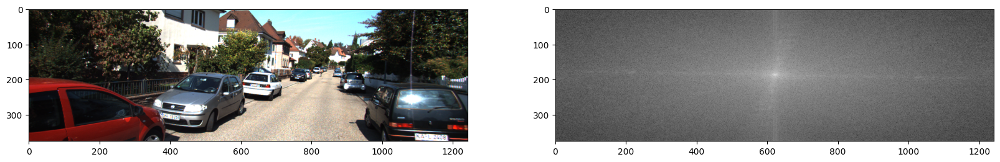

In [7]:
image = cv2.imread(left_image_paths[8])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
f_image = fft_image(norm_image)
f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax2.imshow(f_image, cmap='gray')
plt.show()

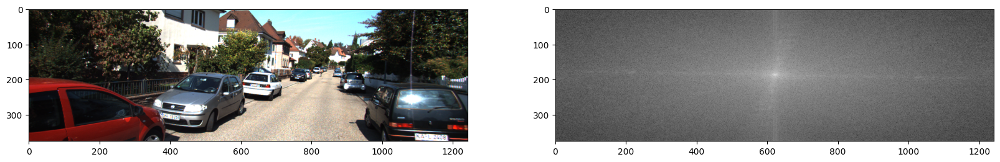

In [8]:
image = cv2.imread(left_image_paths[8])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
f_image = fft_image(norm_image)
f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax2.imshow(f_image, cmap='gray')
plt.show()

In [9]:
import cv2
import cv2 as cv

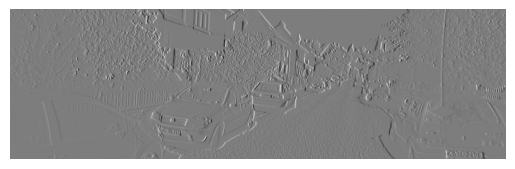

In [13]:
image = cv2.imread(left_image_paths[8])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
def filters(image ,ksize =3):
    images= []
    
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    ret2,th2 = cv2.threshold(image,image.mean(),255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    laplacian = cv.Laplacian(image,cv.CV_64F,ksize=ksize)
    sobelx = cv.Sobel(image,cv.CV_64F,1,0,ksize=ksize)
    sobely = cv.Sobel(image,cv.CV_64F,0,1,ksize=ksize)
    edge = np.sqrt(sobelx**2 + sobely**2)
    canny =cv.Canny(image ,ret2-25 , ret2+25 )
    images = [image , laplacian ,sobelx ,sobely , edge ,canny]
    names = ['orginal' , 'laplacian' ,'sobelx' , 'sobely'  , 'sobel_x_y' ,'canny']
    return  images ,names
    #     images = [image , laplacian ,sobelx ,sobely ,prewitt_x,prewitt_y, edge ,canny]
i , m  =filters(image ,ksize=3)
plt.imshow(i[2] ,cmap='gray')
plt.axis('off') 
plt.show()

## 2. Creating a Filter, Edge Detection

## High-pass Filters
### It's up to you to create a Sobel x operator and apply it to the given image.

In [17]:
def filters(image ,ksize =3):
    images= []
    lab =  np.array([[0 ,-1 ,0] ,
                        [-1 ,4 ,-1 ] ,
                       [0 ,-1 , 0]])
    pri_x = np.array([[-1 ,0 ,1] ,
                        [-1 ,0 ,1 ] ,
                       [-0 ,0 , 1]])
    pri_y = pri_x.T

    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    ret2,th2 = cv2.threshold(image,image.mean(),255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    laplacian = cv2.filter2D(gray , -1 , lab)
    sobel_y = np.array([[-1 ,-2 ,-1] ,
                        [0 ,0 ,0 ] ,
                       [1 ,2 , 1]])
    sobel_x =sobel_y.T
    sobelx = cv2.filter2D(gray , -1 , sobel_x)
    sobely =  cv2.filter2D(gray , -1 , sobel_y)
    prewitt_x =cv2.filter2D(gray , -1 , pri_x)
    prewitt_y =cv2.filter2D(gray , -1 , pri_y)
    edge = np.sqrt(sobelx**2 + sobely**2)
    canny =cv.Canny(image ,ret2-25 , ret2+25 )
    images = [image , laplacian ,sobelx ,sobely ,prewitt_x,prewitt_y, edge ,canny]
    names = ['orginal' , 'laplacian' ,'sobelx' , 'sobely' ,'prewitt_x','prewitt_y' , 'sobel_x_y' ,'canny']
    return  [images ,names]

### laplacian

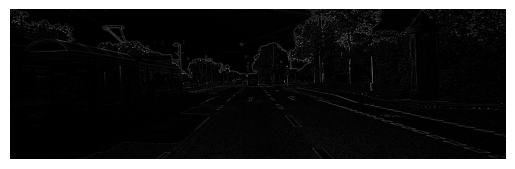

In [18]:
lab =  np.array([[0 ,-1 ,0] ,
                    [-1 ,4 ,-1 ] ,
                   [0 ,-1 , 0]])

filtered_image_x = cv2.filter2D(gray , -1 , lab)
plt.imshow(filtered_image_x,cmap = 'gray')
plt.axis('off') 
plt.show()

# lab 

### sobelx and sobely 

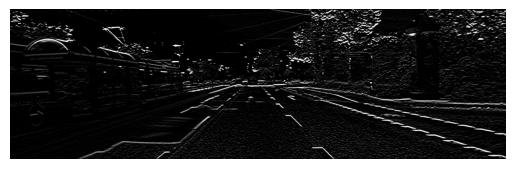

In [19]:
sobel_y = np.array([[-1 ,-2 ,-1] ,
                    [0 ,0 ,0 ] ,
                   [1 ,2 , 1]])
sobel_x =sobel_y.T

filtered_image_x = cv2.filter2D(gray , -1 , sobel_y)
plt.imshow(filtered_image_x,cmap = 'gray')
plt.axis('off') 
plt.show()

# sobel y

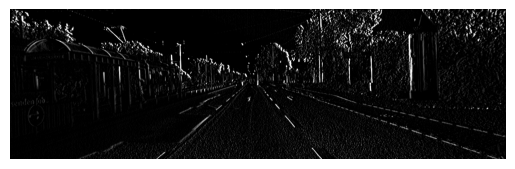

In [20]:
sobel_y = np.array([[-1 ,-2 ,-1] ,
                    [0 ,0 ,0 ] ,
                   [1 ,2 , 1]])
sobel_x =sobel_y.T

filtered_image_x = cv2.filter2D(gray , -1 , sobel_x)
plt.imshow(filtered_image_x,cmap = 'gray')
plt.axis('off') 
plt.show()
#sobel x

### prewitt_x and prewitt_y

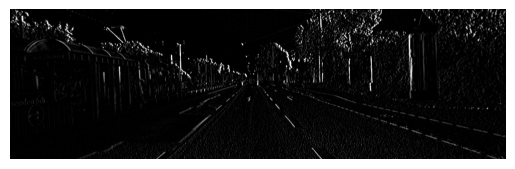

In [21]:
pri_x = np.array([[-1 ,0 ,1] ,
                    [-1 ,0 ,1 ] ,
                   [-1 ,0 , 1]])
pri_y = pri_x.T

filtered_image_x = cv2.filter2D(gray , -1 , pri_x)
plt.imshow(filtered_image_x,cmap = 'gray')
plt.axis('off') 
plt.show()
#pri_x

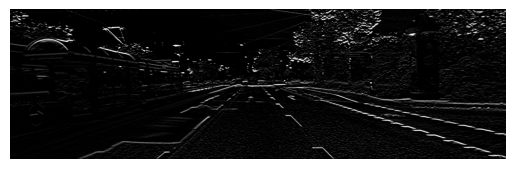

In [22]:
pri_x = np.array([[-1 ,0 ,1] ,
                    [-1 ,0 ,1 ] ,
                   [-1 ,0 , 1]])
pri_y = pri_x.T

filtered_image_x = cv2.filter2D(gray , -1 , pri_y)
plt.imshow(filtered_image_x,cmap = 'gray')
plt.axis('off') 
plt.show()
#pri_y

###  sobel  x  y

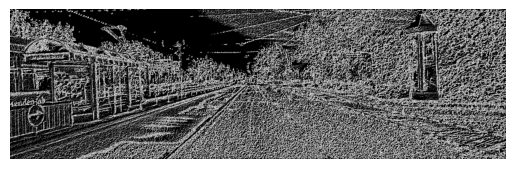

In [23]:
sobel_y = np.array([[-1 ,-2 ,-1] ,
                    [0 ,0 ,0 ] ,
                   [1 ,2 , 1]])
sobel_x =sobel_y.T

filtered_image_x = cv2.filter2D(gray , -1 , sobel_x)
filtered_image_y = cv2.filter2D(gray , -1 , sobel_y)
edge = np.sqrt(filtered_image_x**2 + filtered_image_y**2)
plt.imshow(edge,cmap = 'gray')
plt.axis('off') 
plt.show()

# sobel  X y

## Low-pass Filters
### Gaussian Blur


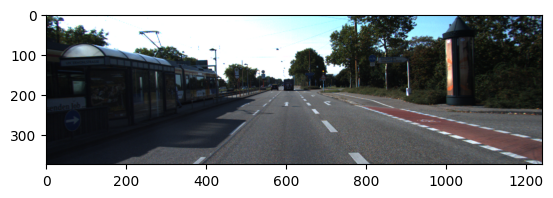

In [24]:
image = cv2.imread(IMG_ROOT +'/000081.png')

image_copy = np.copy(image)

image_copy = cv2.cvtColor(image_copy , cv2.COLOR_BGR2RGB)

plt.imshow(image_copy)
plt.show()

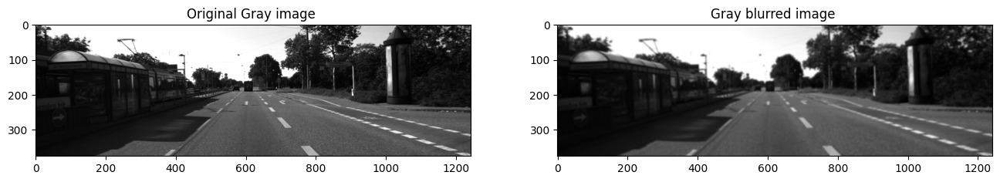

In [25]:
gray =cv2.cvtColor(image_copy , cv2.COLOR_RGB2GRAY)
gray_blur =cv2.GaussianBlur(gray , (9,9) , 0)
fig , ax = plt.subplots(1 , 2 , figsize=(16 , 8))
ax[0].set_title('Original Gray image ')
ax[0].imshow(gray ,cmap = 'gray')
ax[1].set_title('Gray blurred image ')
ax[1].imshow(gray_blur , cmap = 'gray')
plt.show()


### Test performance with a high-pass filter

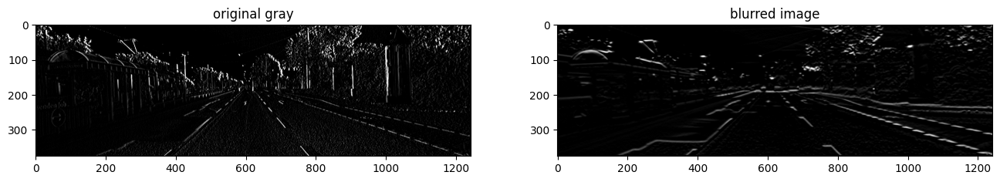

In [26]:
filtered = cv2.filter2D(gray , -1 , sobel_x)
filtered_blurred = cv2.filter2D(gray_blur , -1 , sobel_y)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

ax1.set_title('original gray')
ax1.imshow(filtered, cmap='gray')

ax2.set_title('blurred image')
ax2.imshow(filtered_blurred, cmap='gray')
plt.show()


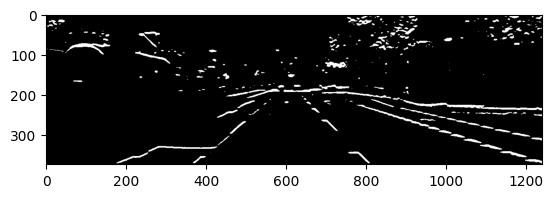

In [27]:
# threshold that sets all the filtered pixels to white
retval, binary_image = cv2.threshold(filtered_blurred, 50, 255, cv2.THRESH_BINARY)

plt.imshow(binary_image, cmap='gray')
plt.show()

## High and Low Pass Filters
Now, you might be wondering, what makes filters high and low-pass; why is a Sobel filter high-pass and a Gaussian filter low-pass?

Well, you can actually visualize the frequencies that these filters block out by taking a look at their fourier transforms. The frequency components of any image can be displayed after doing a Fourier Transform (FT). An FT looks at the components of an image (edges that are high-frequency, and areas of smooth color as low-frequency), and plots the frequencies that occur as points in spectrum. So, let's treat our filters as small images, and display them in the frequency domain!

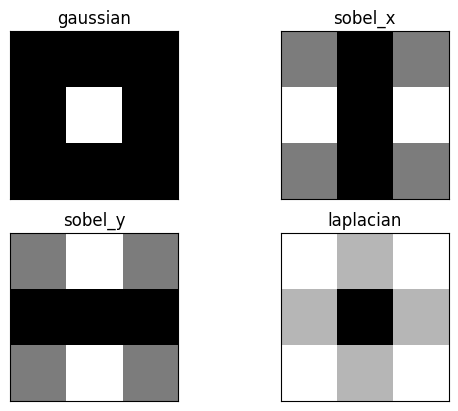

In [28]:
gaussian =(1/9)*np.ones([3,3])
laplacian =np.array([[0 , 1 , 0 ] , 
                   [ 1 , -4 , 1] , 
                   [0 , 1 , 0]])
filters = [gaussian , sobel_x , sobel_y ,laplacian]
filter_name = ['gaussian' , 'sobel_x' , 'sobel_y' , 'laplacian']

#performm a fast fourier transform on each filter
f_filters = [np.fft.fft2(x) for x in filters]
fshift = [np.fft.fftshift(y) for y in f_filters]
frequency_tx = [np.log(np.abs(z)+1) for z in fshift]

for i in range(len(filters)):
    plt.subplot(2,2,i+1),plt.imshow(frequency_tx[i],cmap = 'gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])

plt.show()

#  Canny edge detection

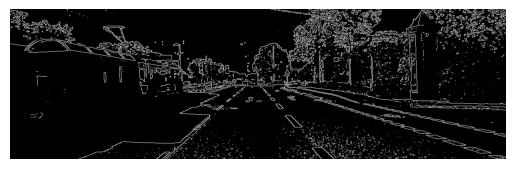

In [29]:
wide = cv2.Canny(gray, 100, 100)
plt.imshow(wide,cmap = 'gray')
plt.axis('off') 
plt.show()
#Canny

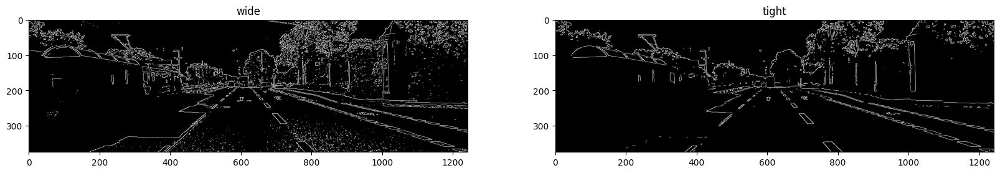

In [30]:
wide = cv2.Canny(gray, 100, 100)
tight = cv2.Canny(gray, 180, 220)
 
    
# Display the images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('wide')
ax1.imshow(wide, cmap='gray')

ax2.set_title('tight')
ax2.imshow(tight, cmap='gray')
plt.show()

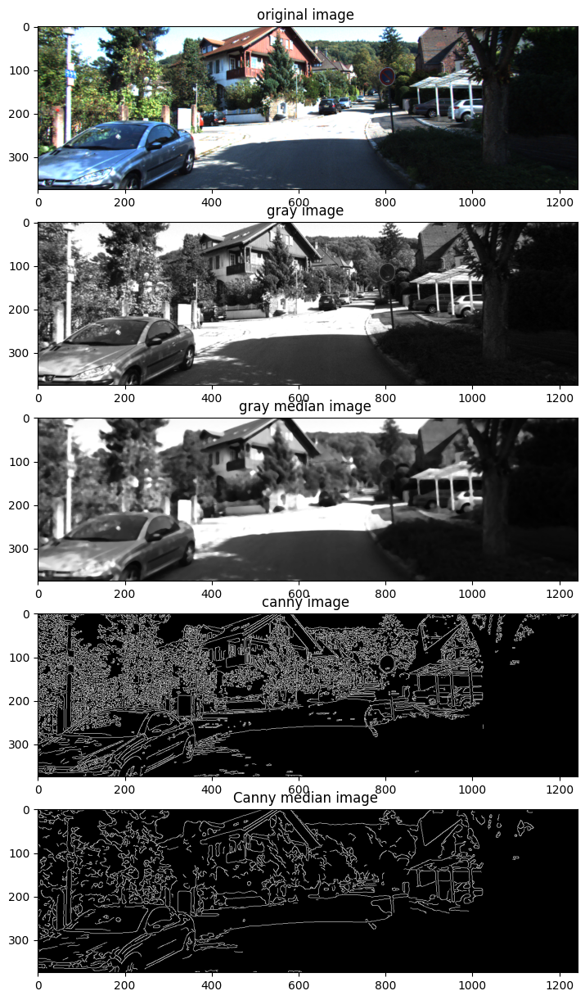

In [31]:
image = cv2.imread(IMG_ROOT +'/000136.png')
image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image , cv2.COLOR_RGB2GRAY)
gray_median = cv2.medianBlur(gray,7)
low_threshold = 80
high_threshold = 150 
edges = cv2.Canny(gray , low_threshold , high_threshold)
edges_median = cv2.Canny(gray_median , low_threshold , high_threshold)


f, (ax1, ax2 ,ax3, ax4,ax5) = plt.subplots(5, 1, figsize=(16,15))
ax1.set_title('original image ')
ax2.set_title('gray image ')
ax3.set_title('gray median image ')
ax4.set_title('canny image ')
ax5.set_title('Canny median image ')
ax1.imshow(image)
ax2.imshow(gray , cmap='gray')
ax3.imshow(gray_median , cmap='gray')
ax4.imshow(edges , cmap='gray')
ax5.imshow(edges_median , cmap='gray')
plt.show()

###  Now that you've seen how to define and use image filters for smoothing images and detecting the edges 

### (high-frequency) components of objects in an image

# Edges to Boundaries and Shapes
## Hough Lines


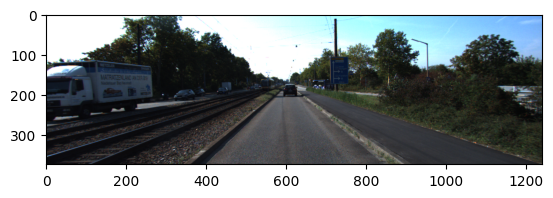

In [32]:
image = cv2.imread(IMG_ROOT +'/000137.png')
image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

## Perform edge detection 

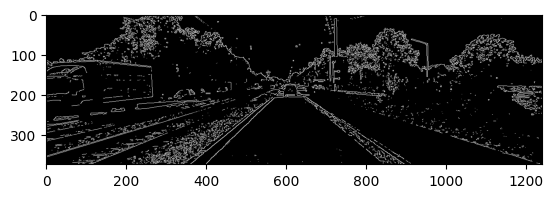

In [33]:
gray = cv2.cvtColor(image , cv2.COLOR_RGB2GRAY)
low_threshold = 120 
high_threshold = 130
edges = cv2.Canny(gray , low_threshold , high_threshold)

plt.imshow(edges , cmap='gray')

## Find lines using a Hough transform

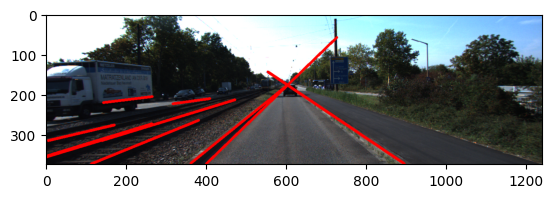

In [34]:
rho = 1
theta = np.pi /180
threshold = 200 
min_line_length = 20 
max_line_gap = 30

line_image = np.copy(image)
lines = cv2.HoughLinesP(edges , rho , theta , threshold , np.array([]) ,
                       min_line_length, max_line_gap)

for line in lines :
    for x1,y1 ,x2,y2 in line:
        cv2.line(line_image , (x1,y1) ,(x2,y2) ,(255 , 0 ,0) ,5)
plt.imshow(line_image)

## Hough Circle Detection

### HoughCircles function

`HoughCircles` takes in a few things as its arguments:
* an input image, detection method (Hough gradient), resolution factor between the detection and image (1),
* minDist - the minimum distance between circles
* param1 - the higher value for performing Canny edge detection
* param2 - threshold for circle detection, a smaller value --> more circles will be detected
* min/max radius for detected circles

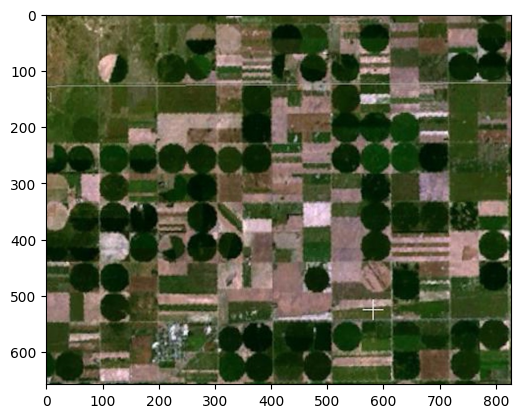

In [35]:
image = cv2.imread('../images/round_farms.jpg')
image =cv2.cvtColor(image ,cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

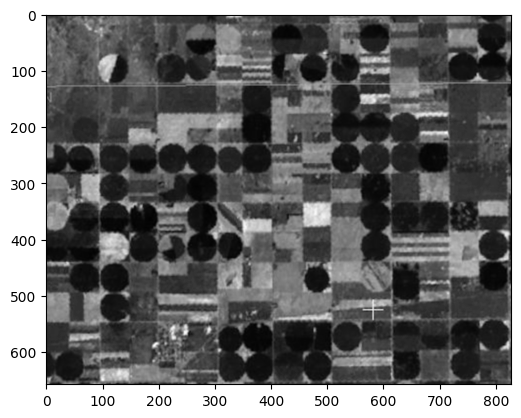

In [36]:
gray = cv2.cvtColor(image ,cv2.COLOR_RGB2GRAY)
gray_blur = cv2.GaussianBlur(gray ,(3,3) ,0)

plt.imshow(gray_blur ,cmap='gray')

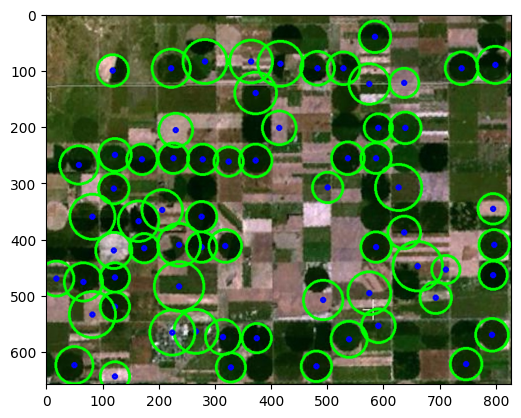

In [37]:
circles_im = np.copy(image)
green =(0,255,0)
blue =(0,0,255)
circles = cv2.HoughCircles(gray_blur , cv2.HOUGH_GRADIENT ,1 ,minDist =40,
                          param1 =240 ,
                          param2 =10 ,
                          minRadius=25 ,
                          maxRadius = 45)
circles = np.uint16(np.around(circles))

for i in circles[0, :] :
    cv2.circle(circles_im , (i[0] , i[1]) , i[2] , green , 3)
    cv2.circle( circles_im , (i[0] , i[1]) ,3 , blue , 3)
    
plt.imshow(circles_im )

# Canny Edge Detection in Action
it's time to use it to find the edges of the lane lines in an image of the road. So let's give that a try.


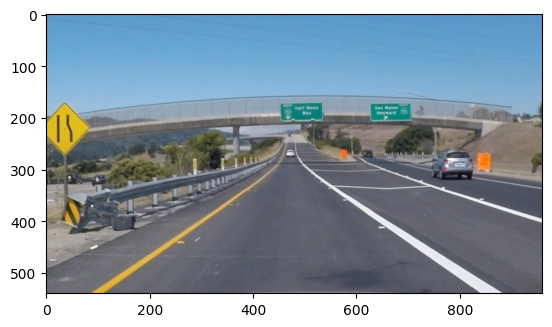

In [38]:
image = cv2.imread('../images/exit-ramp.jpg')

# convert to RGB 
image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

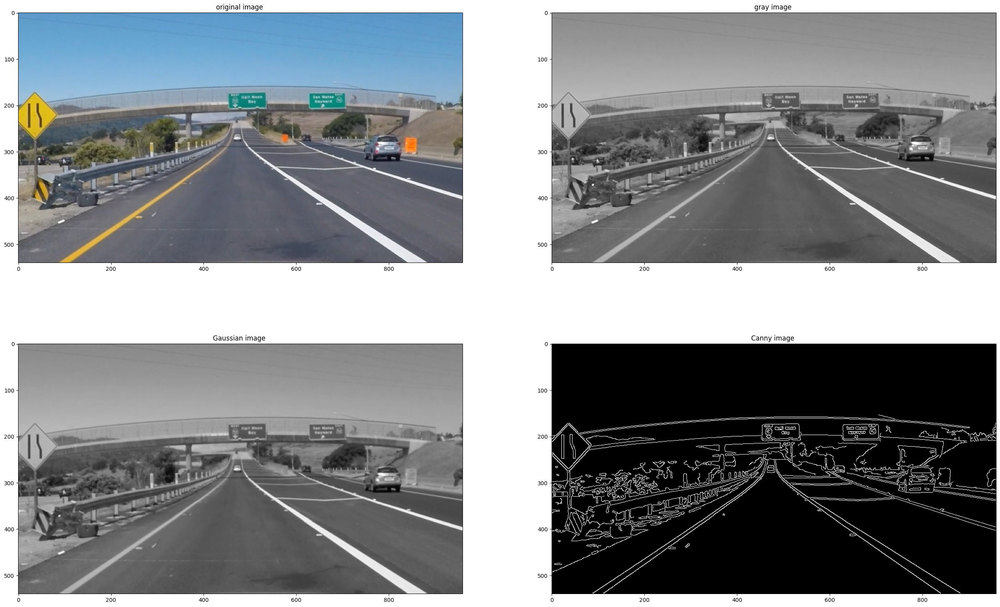

In [39]:
# convert image to gray 
gray = cv2.cvtColor(image , cv2.COLOR_RGB2GRAY)


# kernel size for Gaussian smoothing / blurring
kernel_size = 3
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size), 0)

# canny 
# parameters for Canny and run it
low_threshold = 50
high_threshold = 150
edges = cv2.Canny(blur_gray, low_threshold, high_threshold)
fig , ax = plt.subplots(2 , 2 , figsize=(32,20))
ax[0,0].set_title('original image ')
ax[0,1].set_title('gray image ')
ax[1,0].set_title('Gaussian image ')
ax[1,1].set_title('Canny image ')

ax[0,0].imshow(image)
ax[0,1].imshow(gray , cmap='gray')
ax[1,0].imshow(blur_gray , cmap='gray')
ax[1,1].imshow(edges , cmap='gray')
plt.show()

# Using the Hough Transform to Find Lines from Canny Edges

create a masked edges image using   `cv2.fillPoly()`

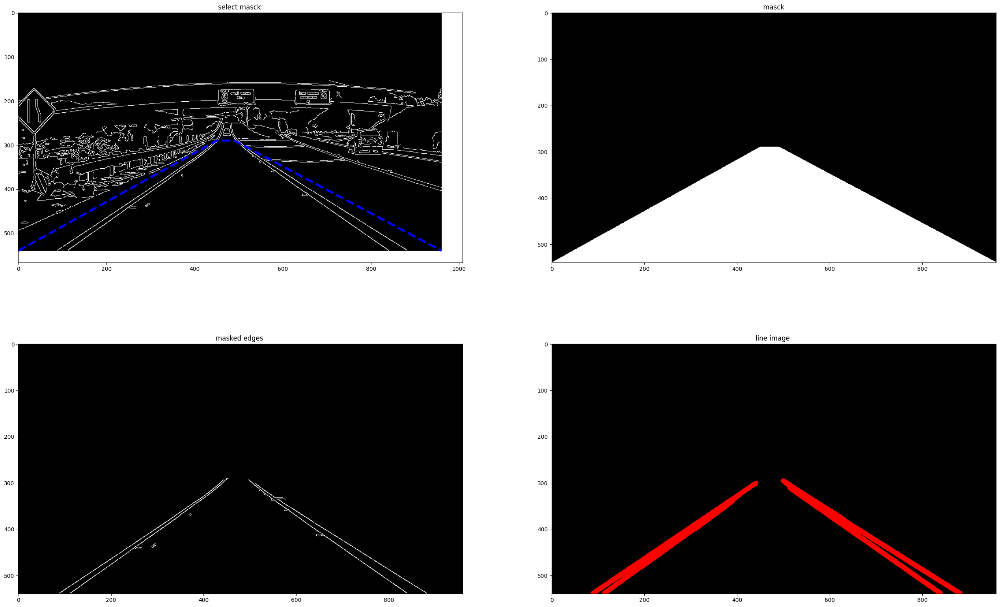

In [40]:
mask = np.zeros_like(edges)   
ignore_mask_color = 255   
imshape = image.shape
vertices = np.array([[(0,imshape[0]),(450, 290), (490, 290), (imshape[1],imshape[0])]], dtype=np.int32)

x = [0,450, 490 ,imshape[1]]
y = [imshape[0] , 290 , 290 ,imshape[0] ]




cv2.fillPoly(mask, vertices, ignore_mask_color)



masked_edges = cv2.bitwise_and(edges, mask)

rho =2
theta =np.pi/180 
threshold =100
min_line_length = 40 
max_line_gap = 20
line_image = np.copy(image) *0
lines = cv2.HoughLinesP(masked_edges  , rho ,theta , threshold ,np.array([]) ,
                        min_line_length ,max_line_gap)

for line in lines :
    for x1,y1,x2,y2 in line :
        cv2.line(line_image ,(x1,y1),(x2,y2) , (255,0,0) , 10)
        

fig , ax = plt.subplots(2 , 2 , figsize=(32,20))
ax[0,0].set_title('select masck ')
ax[0,1].set_title(' masck ')
ax[1,0].set_title('masked edges ')
ax[1,1].set_title('line image ')

ax[0,0].imshow(edges , cmap='gray')
ax[0,0].plot(x, y, 'b--', lw=4)
ax[0,1].imshow(mask , cmap='gray')

ax[1,0].imshow(masked_edges , cmap='gray')
ax[1,1].imshow(line_image)
plt.show()

# Dilation and Erosion


Dilation and erosion are known as **morphological operations.** They are often performed on binary images, similar to contour detection. Dilation enlarges bright, white areas in an image by adding pixels to the perceived boundaries of objects in that image. Erosion does the opposite: it removes pixels along object boundaries and shrinks the size of objects.


Often these two operations are performed in sequence to enhance important object traits!

# Dilation
To dilate an image in OpenCV, you can use the **dilate** function and three inputs: an original binary image, a kernel that determines the size of the dilation (None will result in a default size), and a number of iterations to perform the dilation (typically = 1). In the below example, we have a 5x5 kernel of ones, which move over an image, like a filter, and turn a pixel white if any of its surrounding pixels are white in a 5x5 window! We’ll use a simple image of the cursive letter “j” as an example.

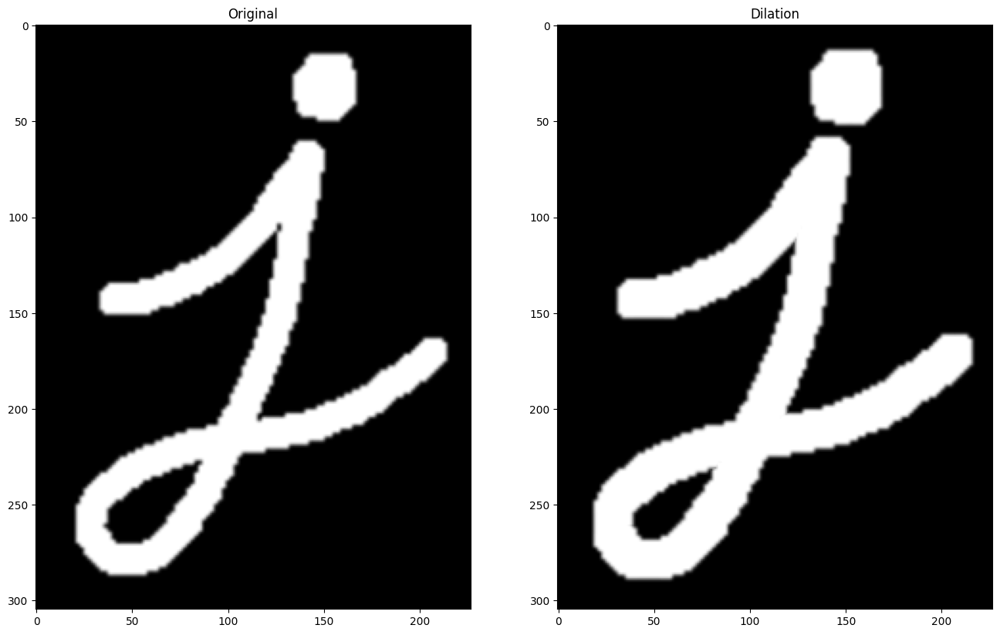

In [41]:
# Reads in a binary image
image = cv2.imread('../images/j.png', 0) 

# Create a 5x5 kernel of ones
kernel = np.ones((5,5),np.uint8)
# Dilate the image
dilation = cv2.dilate(image, kernel, iterations = 1)
# Display the images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,10))

ax1.set_title('Original')
ax1.imshow(image, cmap='gray')

ax2.set_title('Dilation')
ax2.imshow(dilation, cmap='gray')
plt.show()

# Erosion
### To erode an image, we do the same but with the **erode** function.

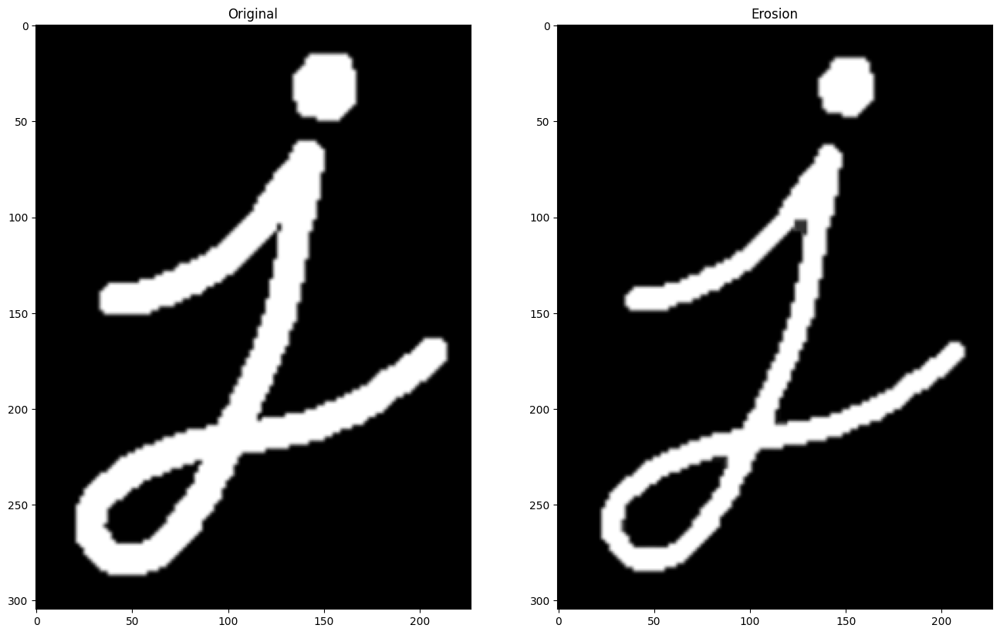

In [42]:
# Erode the image
erosion = cv2.erode(image, kernel, iterations = 1)


# Display the images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,10))

ax1.set_title('Original')
ax1.imshow(image, cmap='gray')

ax2.set_title('Erosion')
ax2.imshow(erosion, cmap='gray')
plt.show()

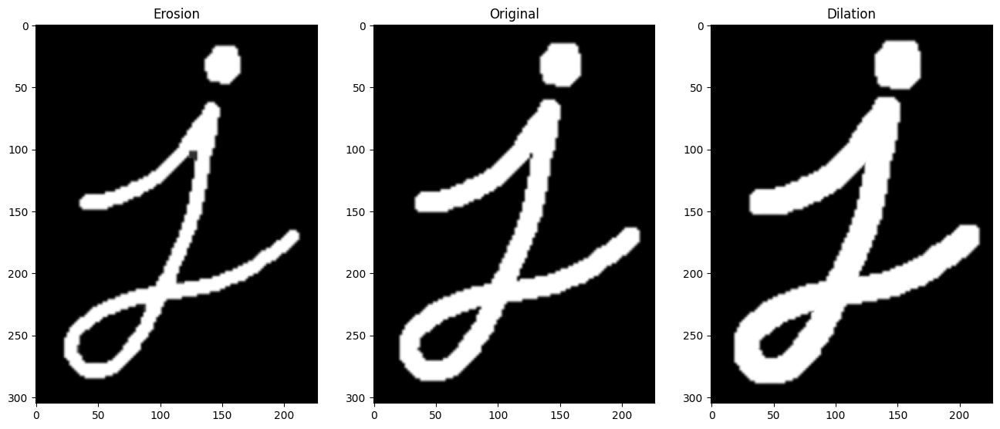

In [43]:
f, (ax1, ax2 ,ax3) = plt.subplots(1, 3, figsize=(16,8))
ax1.set_title('Erosion')
ax1.imshow(erosion, cmap='gray')
ax2.set_title('Original')
ax2.imshow(image, cmap='gray')
ax3.set_title('Dilation')
ax3.imshow(dilation, cmap='gray')

plt.show()

# Image segmentation 

Now that we are familiar with a few simple feature types, it may be useful to look at how we can group together different parts of an image by using these features. Grouping or segmenting images into distinct parts is known as image segmentation.

The simplest case for image segmentation is in background subtraction. In video and other applications, it is often the case that a human has to be isolated from a static or moving background, and so we have to use segmentation methods to distinguish these areas. Image segmentation is also used in a variety of complex recognition tasks, such as in classifying every pixel in an image of the road.

we'll look at a couple ways to segment an image:


    1. using contours to draw boundaries around different parts of an image . 
    2. clustering image data by some measure of color or texture similarity.

# 1- Finding Contours

### Import resources and display image

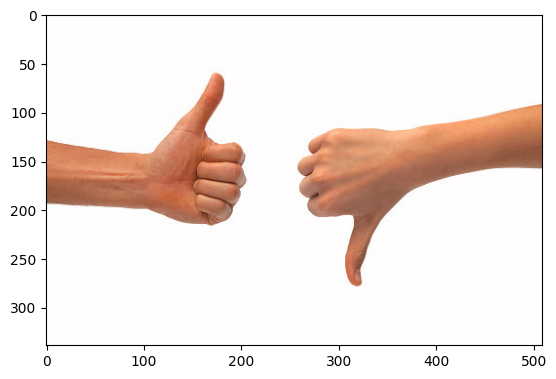

In [44]:
image = cv2.imread('../images/thumbs_up_down.jpg')


# Change color to RGB (from BGR)
image = cv2.cvtColor(image ,cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.show()

### Produce a binary image for finding contours

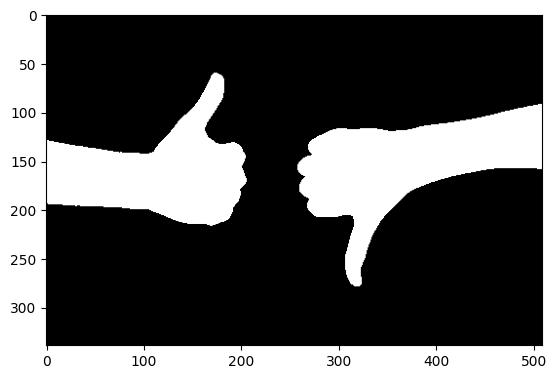

In [45]:
# Convert to grayscale
gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

# Create a binary thresholded image
retval, binary = cv2.threshold(gray, 225, 255, cv2.THRESH_BINARY_INV)

plt.imshow(binary, cmap='gray')
plt.show()

### Find and draw the contours

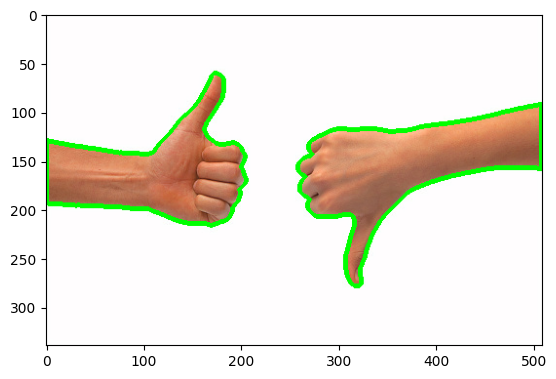

In [46]:
contours , hierarchy = cv2.findContours(binary , cv2.RETR_TREE ,cv2.CHAIN_APPROX_SIMPLE)

# Draw all contours on a copy of the original 
contours_image = np.copy(image)
contours_image = cv2.drawContours(contours_image , contours , -1 , green , 3 )

plt.imshow(contours_image )
plt.show()

# 2- K-means Clustering
### Import resources and display image

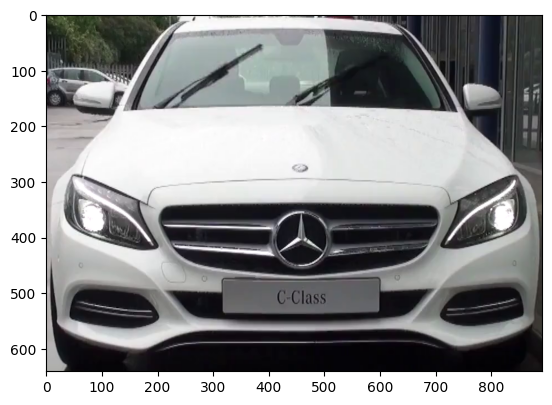

In [47]:
image = cv2.imread('../images/car.png')

# change color to RGB from BGR
image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.show()

## Prepare data for k-means

In [48]:
print(f'shape image befor reshape : {image.shape} ')

# Reshape image into a 2D array of pixels and 3 color values (RGB)
pixel_vals = image.reshape((-1 , 3))
print(f'shape image after  reshape : {pixel_vals.shape} ')

#convert to float type 
pixel_vals = np.float32(pixel_vals)

shape image befor reshape : (641, 892, 3) 
shape image after  reshape : (571772, 3) 


### Implement k-means clustering

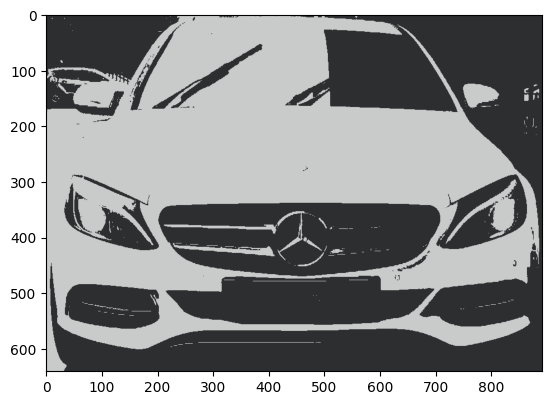

In [49]:
# define stopping criteria 
# you can change the number of max iteration for faster convergence . 
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER , 100 , 0.2 )

# selct value for k number of clustering 
k = 2

retval , labels , centers = cv2.kmeans(pixel_vals , 
                                      k ,
                                      None  , 
                                      criteria ,
                                      10 , 
                                      cv2.KMEANS_RANDOM_CENTERS)



# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]

# reshape data into the original image dimensions 
segmented_data = segmented_data.reshape((image.shape))
labels_reshape =labels.reshape(image.shape[0] , image.shape[1])

plt.imshow(segmented_data)
plt.show()

### Visualize one segment, try to find which is the leaves, background

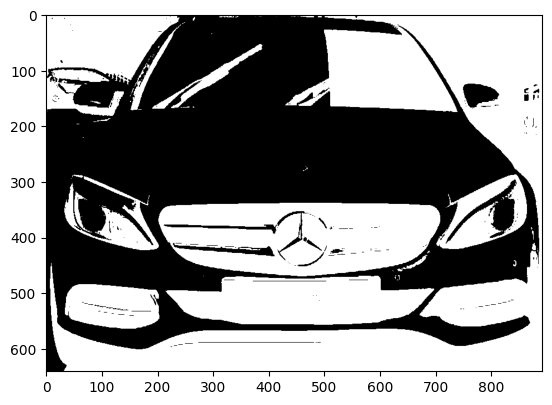

In [50]:
plt.imshow(labels_reshape == 0 , cmap='gray')
plt.show()

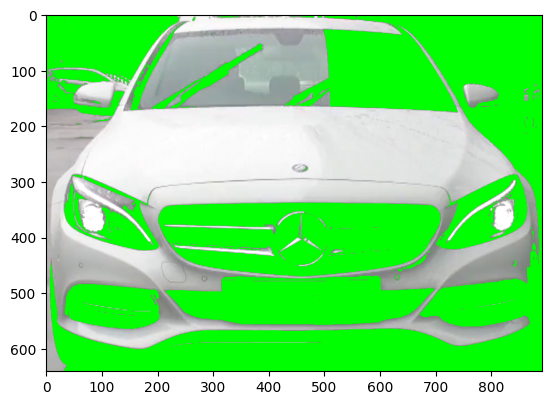

In [51]:
# mask an image segment by cluster 

cluster = 0 # the first cluster 

masked_image = np.copy(image)

#turn the mask green 
masked_image[labels_reshape == cluster ] = [0 , 255 , 0 ]

plt.imshow(masked_image)
plt.show()